TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offs

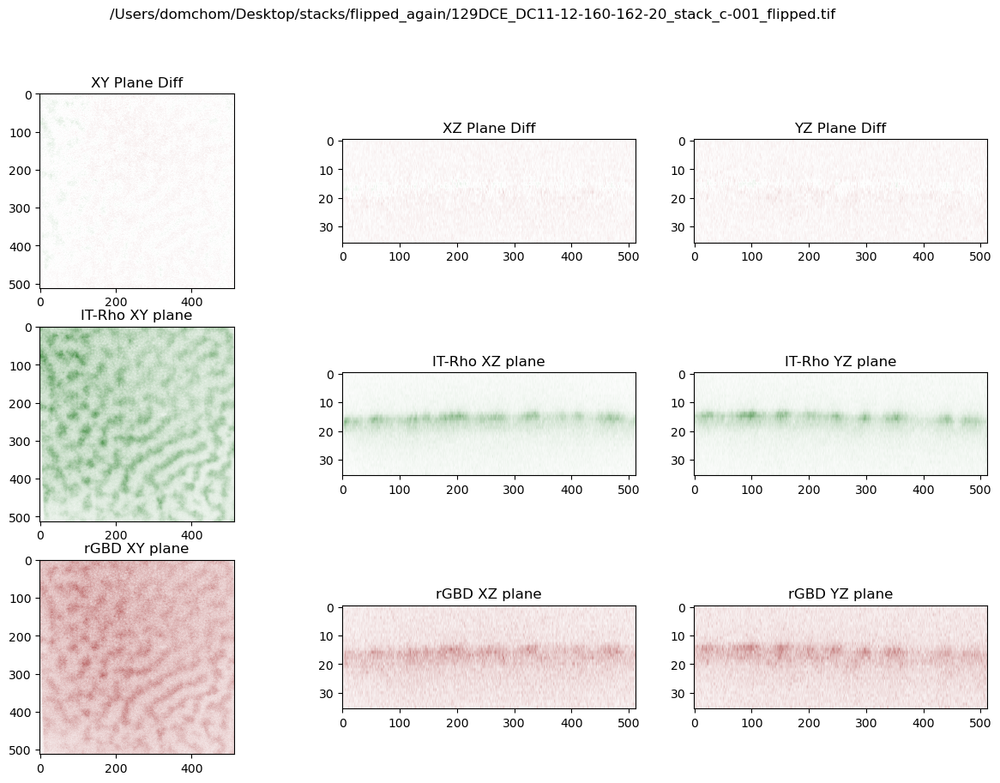

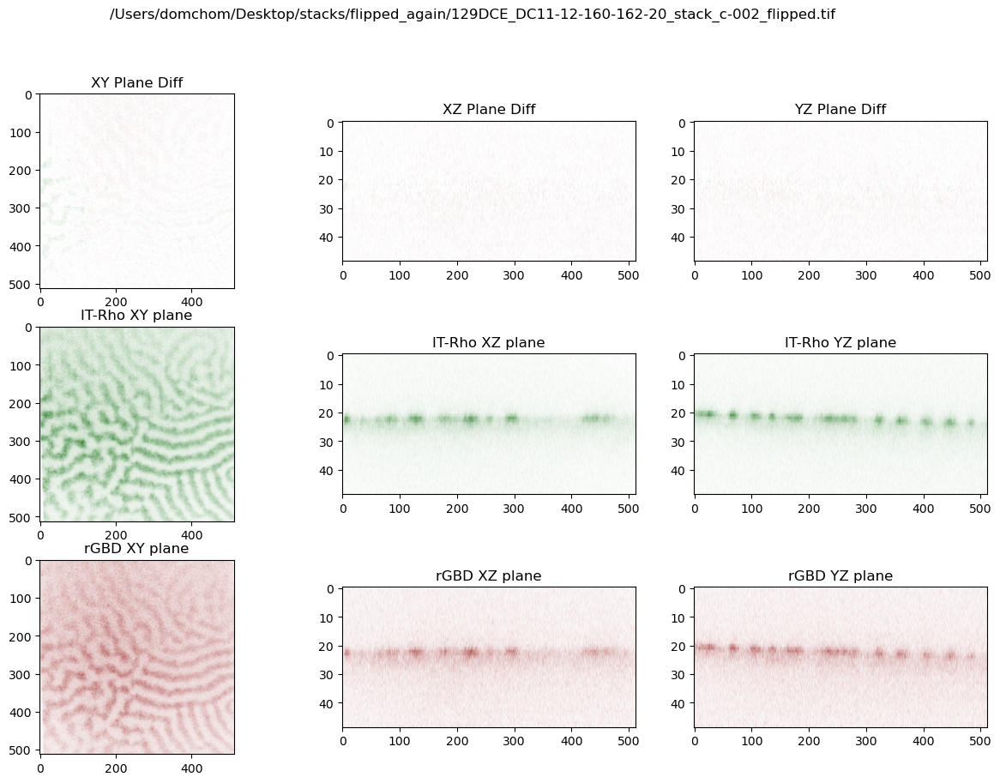

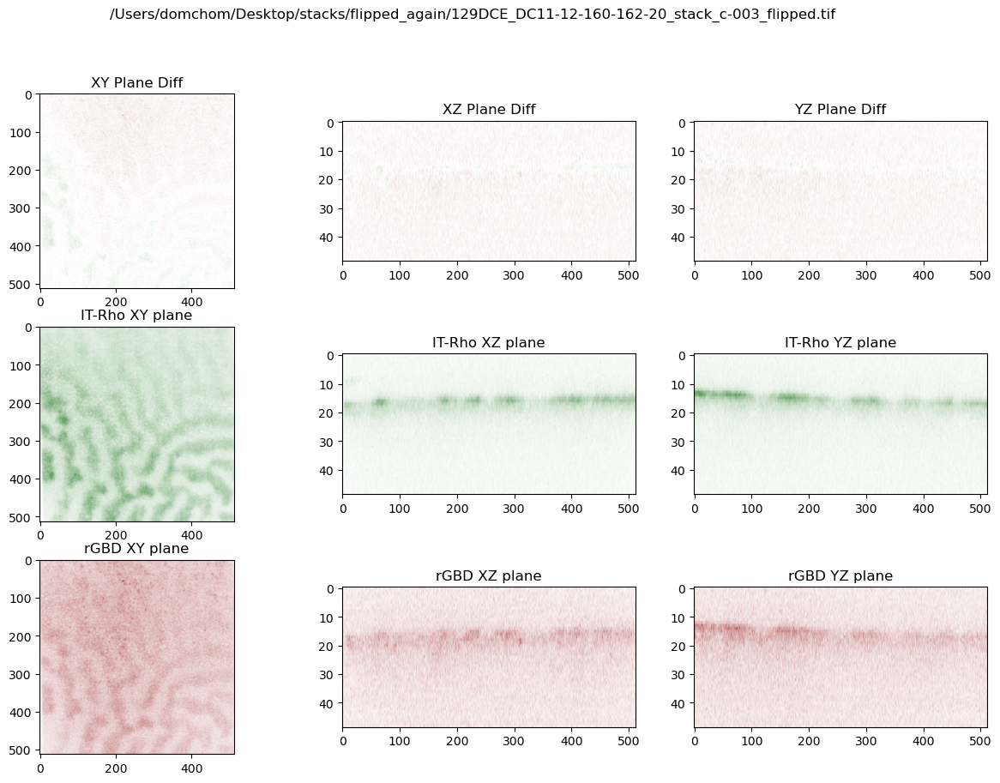

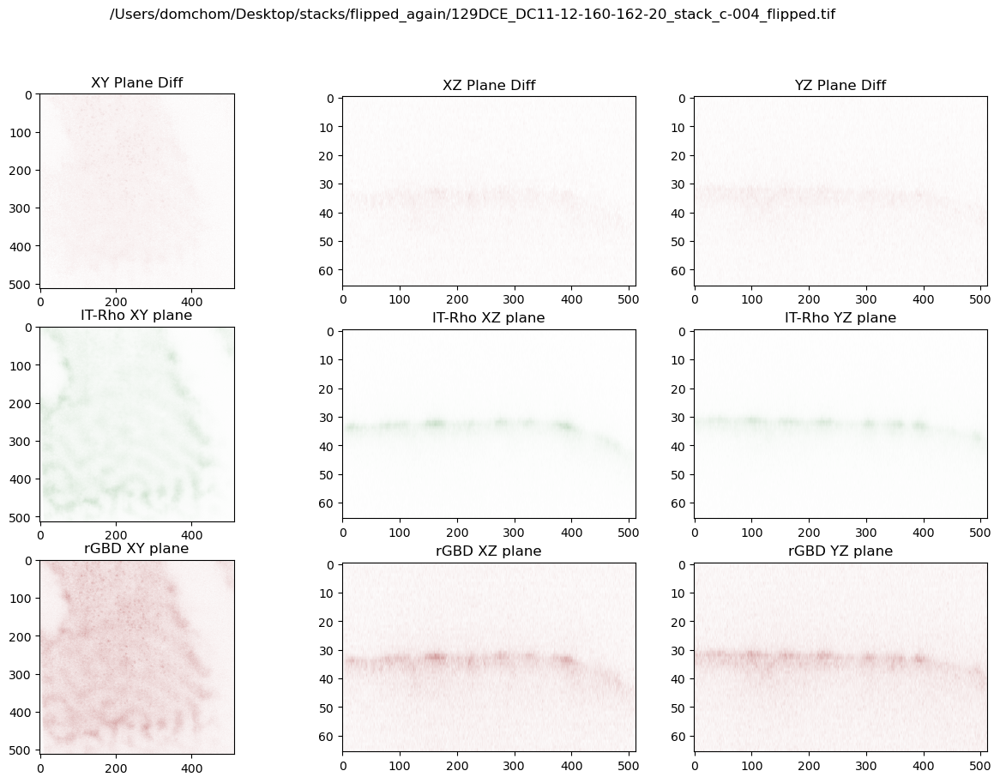

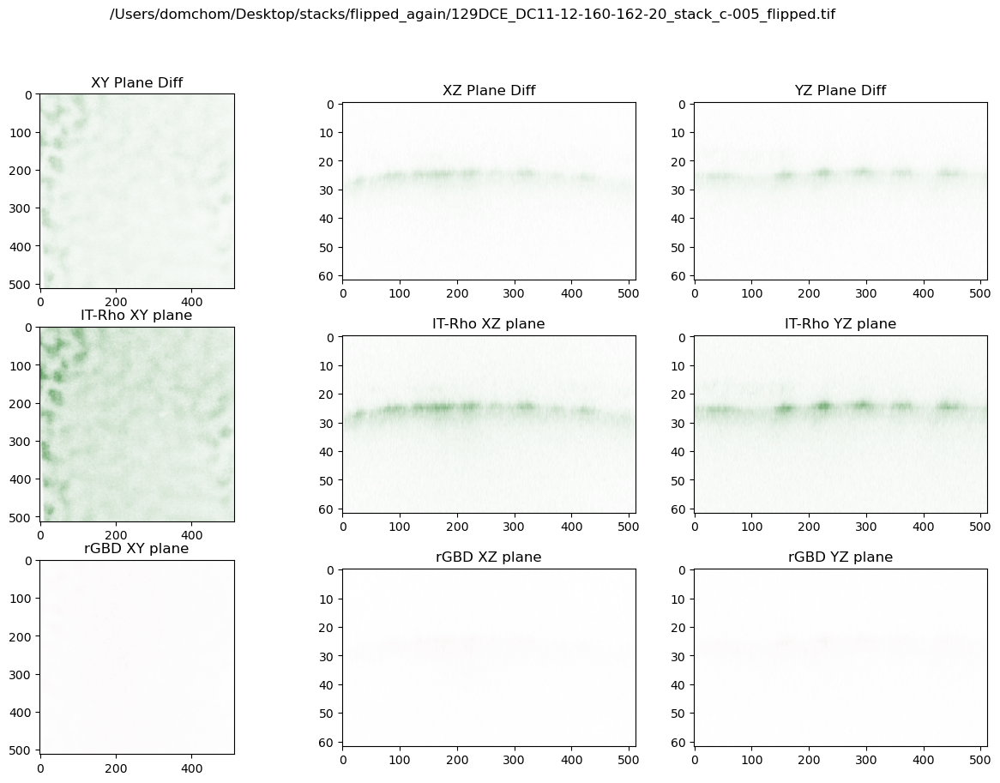

...

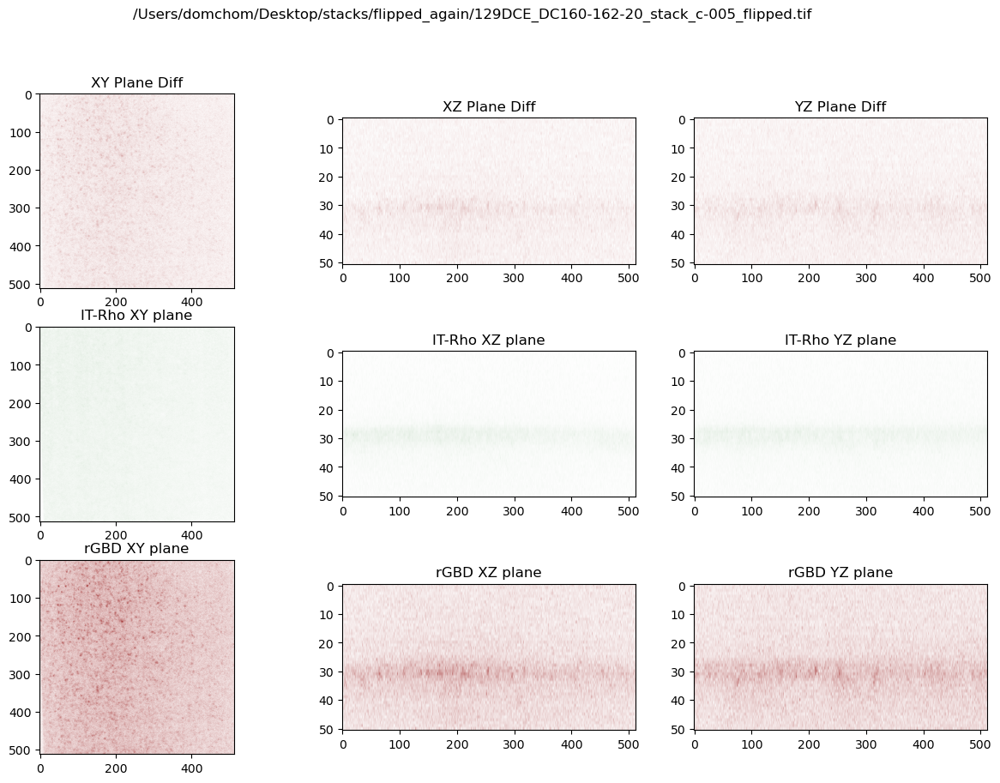

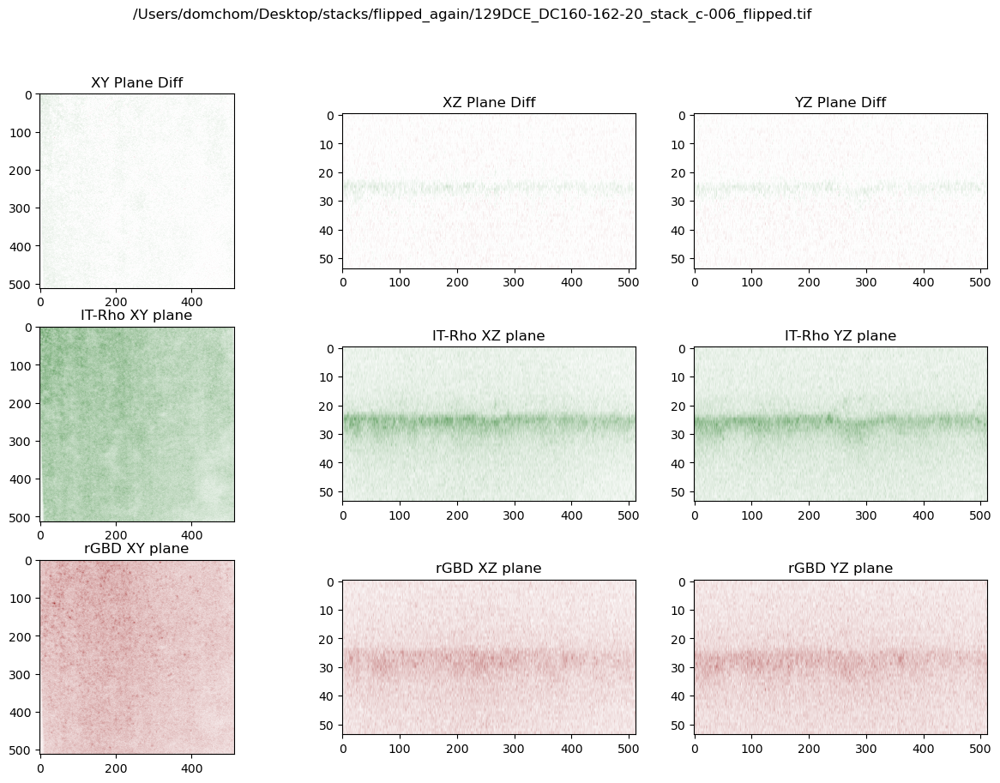

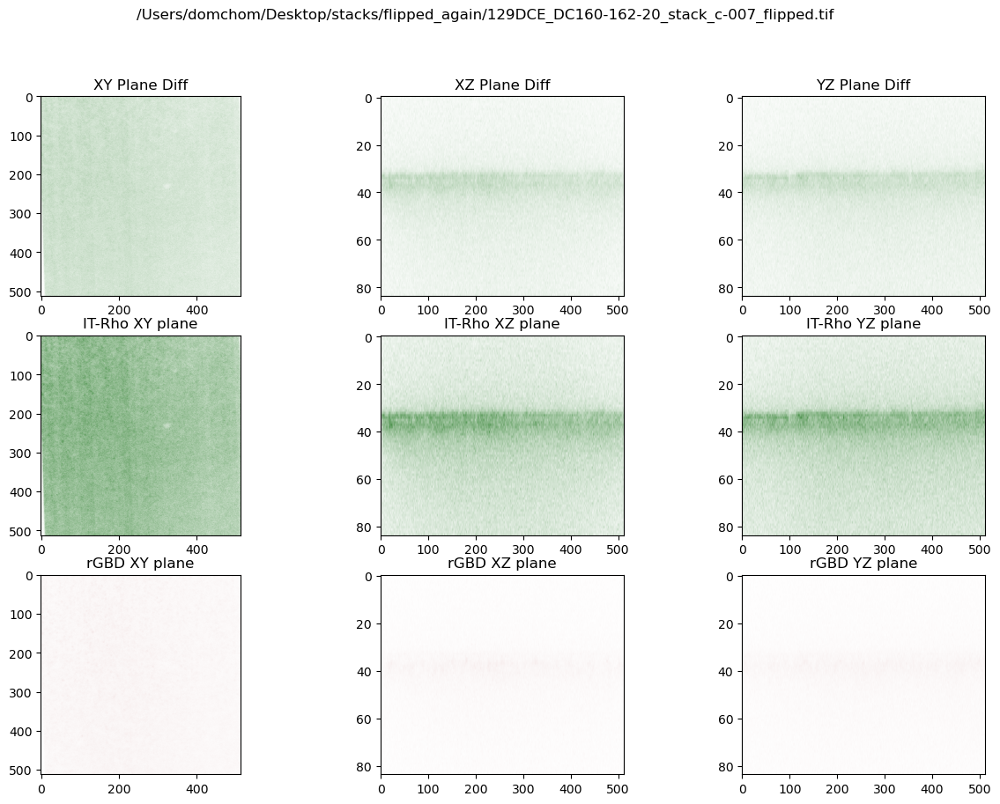

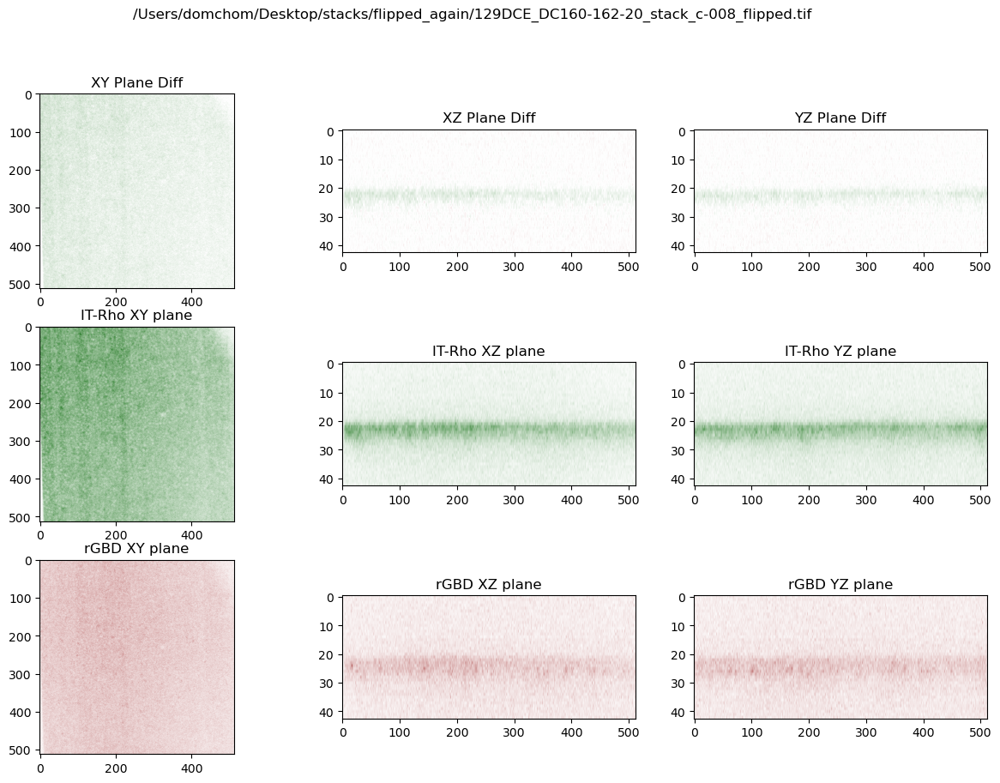

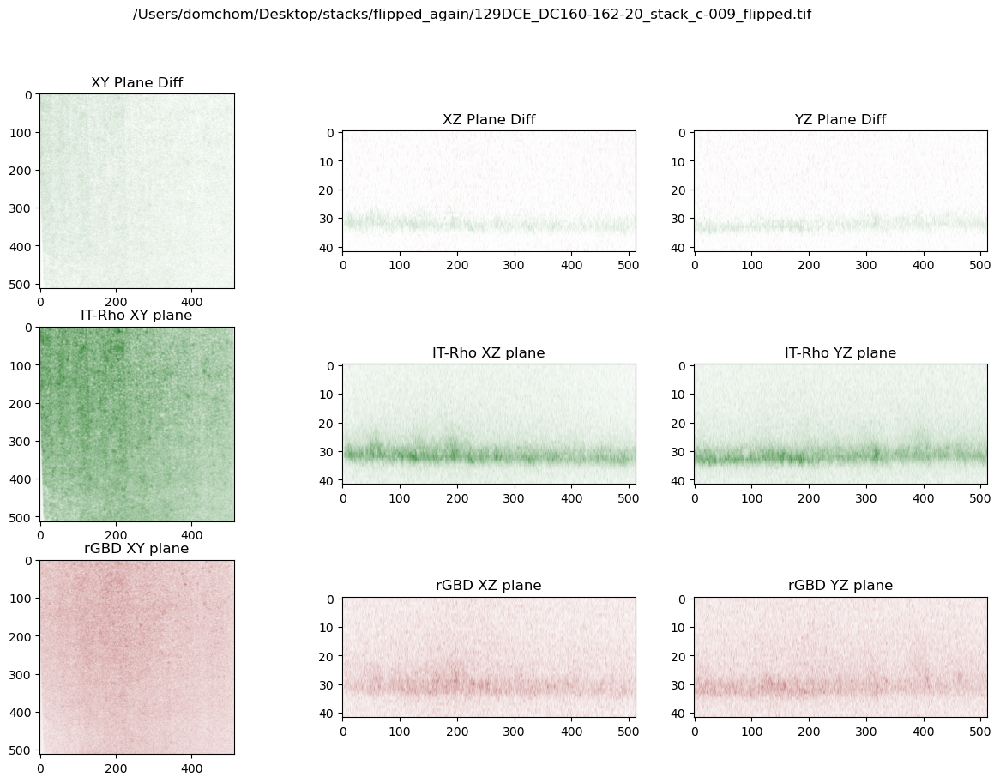

In [3]:
import pathlib
import tifffile as tiff
import matplotlib.colors
import matplotlib.pyplot as plt
import numpy as np

input_path = '/Users/domchom/Desktop/stacks/flipped_again'

def convert_images(directory):
    """
    Converts all TIFF files in a directory to a dictionary of numpy arrays.

    Args:
        directory: A string representing the directory containing the input TIFF files.

    Returns:
        A dictionary mapping file names to numpy arrays.
    """
    input_path = pathlib.Path(directory)
    images = {}

    for file_path in input_path.glob('*.tif'):
        try:
            # Load the TIFF file into a numpy array
            image = tiff.imread(file_path)

            # standardize image dimensions
            with tiff.TiffFile(filename_path) as tif_file:
                metadata = tif_file.imagej_metadata
            num_channels = metadata.get('channels', 1)
            num_slices = metadata.get('slices', 1)
            image = image.reshape(num_slices,
                                    num_channels, 
                                    image.shape[-1],  # columns
                                    image.shape[-2])  # rows
            

            images[file_path.name] = image
                        
        except tiff.TiffFileError:
            print(f"Warning: Skipping '{file_path.name}', not a valid TIF file.")

    # Sort the dictionary keys alphabetically
    images = {key: images[key] for key in sorted(images)}

    return images 

def plot_orthogonal_views(image):
    #plt.style.use('dark_background')
    num_channels = len(image[1])
    
    channels = []

    for channel_num in range(num_channels):
        channel = image[:, channel_num, :, :]
        channels.append(channel)
        slice_means = {}
        i = 0 
        for slice in range(len(channel)):
            mean = np.mean(channel[slice])
            slice_means[i] = mean
            i+=1

    brightest_frame = max(slice_means, key = slice_means.get)
    mid_x = channels[0].shape[1] // 2
    mid_y = channels[0].shape[2] // 2

    ch0_xy_plane = channels[0][brightest_frame, :, :]
    ch0_xz_plane = channels[0][:, mid_x, :]
    ch0_yz_plane = channels[0][:, :, mid_y]

    ch1_xy_plane = channels[1][brightest_frame, :, :]
    ch1_xz_plane = channels[1][:, mid_x, :]
    ch1_yz_plane = channels[1][:, :, mid_y]

    fig, axes = plt.subplots(3, 3, figsize=(15, 10))
    ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9 = axes.flatten()

    cmap_grn = matplotlib.colors.LinearSegmentedColormap.from_list("", ["white", "darkgreen"])
    cmap_red = matplotlib.colors.LinearSegmentedColormap.from_list("", ["white", "darkred"])
    cmap_diff = matplotlib.colors.LinearSegmentedColormap.from_list("", ["darkred", "white", "darkgreen"])

    cmap_grn.set_under("k", 0)
    cmap_red.set_under("k", 0)

    greenlim = [np.min(image[:,0,:,:]), np.max(image[:,0,:,:])]
    redlim = [np.min(image[:,1,:,:]), np.max(image[:,1,:,:])]

    # normalizing the values to be between 1 and 0
    ch0_xy_plane_norm = (ch0_xy_plane-greenlim[0])/(greenlim[1] - greenlim[0])
    ch1_xy_plane_norm = (ch1_xy_plane-redlim[0])/(redlim[1] - redlim[0])

    ch0_xz_plane_norm = (ch0_xz_plane-greenlim[0])/(greenlim[1] - greenlim[0])
    ch1_xz_plane_norm = (ch1_xz_plane-redlim[0])/(redlim[1] - redlim[0])

    ch0_yz_plane_norm = (ch0_yz_plane-greenlim[0])/(greenlim[1] - greenlim[0])
    ch1_yz_plane_norm = (ch1_yz_plane-redlim[0])/(redlim[1] - redlim[0])

    diff_xy = ch0_xy_plane_norm - ch1_xy_plane_norm
    diff_xz = ch0_xz_plane_norm - ch1_xz_plane_norm
    diff_yz = ch0_yz_plane_norm - ch1_yz_plane_norm

    '''diff_xy = ch0_xy_plane - ch1_xy_plane
    diff_xz = ch0_xz_plane - ch1_xz_plane
    diff_yz = ch0_yz_plane - ch1_yz_plane'''


    ax1.imshow(diff_xy, clim = [-2,2], cmap=cmap_diff)
    #ax1.imshow(ch1_xy_plane, cmap='Reds', alpha=alpha)
    ax1.set_title('XY Plane Diff')

    ax2.imshow(diff_xz, clim = [-2,2], cmap=cmap_diff, aspect=5)
    #ax2.imshow(ch1_xz_plane, cmap='Reds', alpha=alpha)
    ax2.set_title('XZ Plane Diff')

    ax3.imshow(diff_yz, clim = [-2,2], cmap=cmap_diff, aspect=5)
    #ax3.imshow(ch1_yz_plane, cmap='Reds', alpha=alpha)
    ax3.set_title('YZ Plane Diff')

    ax4.imshow(ch0_xy_plane_norm, clim = [0,1], cmap=cmap_grn, alpha=1)
    ax4.set_title('IT-Rho XY plane')

    ax5.imshow(ch0_xz_plane_norm, clim = [0,1], cmap=cmap_grn, alpha=1, aspect=5)
    ax5.set_title('IT-Rho XZ plane')

    ax6.imshow(ch0_yz_plane_norm, clim = [0,1], cmap=cmap_grn, alpha=1, aspect=5)
    ax6.set_title('IT-Rho YZ plane')

    ax7.imshow(ch1_xy_plane_norm, clim = [0,1], cmap=cmap_red, alpha=1)
    ax7.set_title('rGBD XY plane')

    ax8.imshow(ch1_xz_plane_norm, clim = [0,1], cmap=cmap_red, alpha=1, aspect=5)
    ax8.set_title('rGBD XZ plane')

    ax9.imshow(ch1_yz_plane_norm, clim = [0,1], cmap=cmap_red, alpha=1, aspect=5)
    ax9.set_title('rGBD YZ plane')

    return fig

if __name__ == "__main__":
    image_stack = convert_images(input_path)
    for image in image_stack:
        fig = plot_orthogonal_views(image_stack[image])
        fig.suptitle(image)
        plt.show(fig)